<a href="https://colab.research.google.com/github/EmillyMLFreitas/avaliacao-lp/blob/resolucao_emilly/Emy_Caracteriza%C3%A7%C3%A3o_Topol%C3%B3gica_da_Rede_Social_de_Aves_Harmoniosas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Esse trecho conecta o Colab à conta do Google Drive, permitindo acessar datasets armazenados na nuvem.
Isso evita recalcular layouts toda vez (mantém a mesma disposição dos grafos), economizando tempo e preparando o ambiente e os dados para análise, resultando em um layout visualmente intuitivo.

Permite comparar visualizações consistentes entre métricas, porque cada nó mantém a mesma posição.

Além disso, permite identificar padrões de conexão, mesmo sem calcular métricas quantitativas ainda.


Downloading...
From: https://drive.google.com/uc?export=download&id=1Obl4Mu5vFZMyutn39CwXwkdEWZNyoZ6A
To: /content/aves-songbird-social.edges
100%|██████████| 22.9k/22.9k [00:00<00:00, 32.1MB/s]


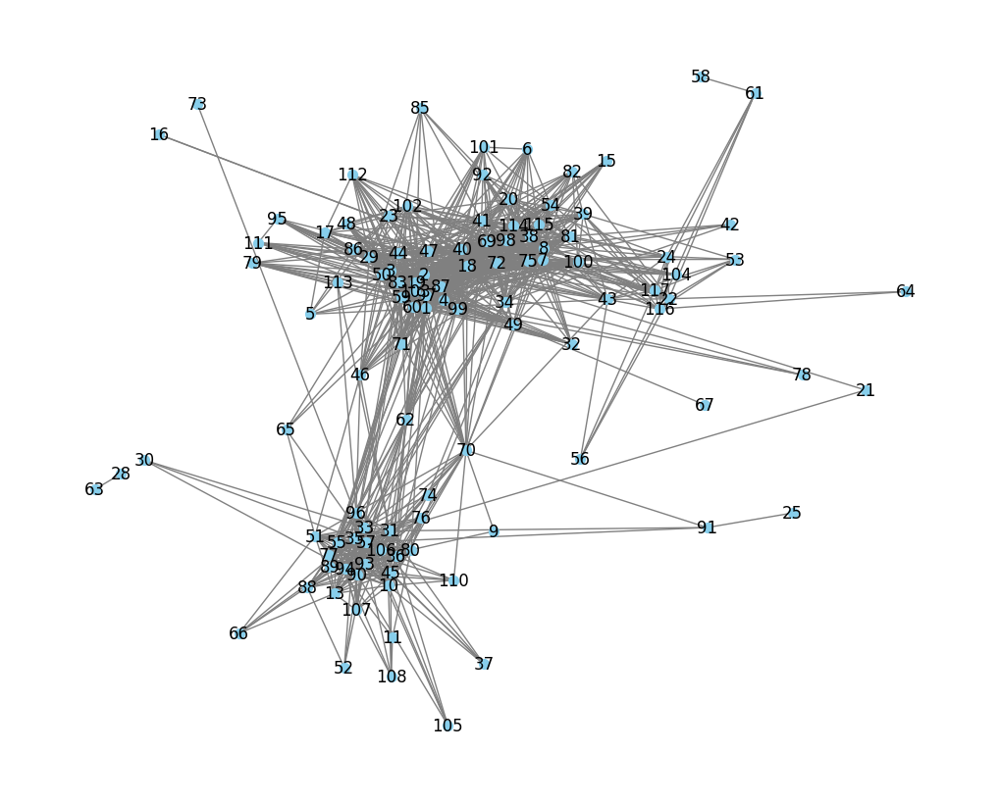

In [ ]:
# Instala o gdown (uma vez só)
!pip install gdown

import gdown
import networkx as nx
import matplotlib.pyplot as plt

# Link de download direto do seu arquivo
url = 'https://drive.google.com/uc?export=download&id=1Obl4Mu5vFZMyutn39CwXwkdEWZNyoZ6A'
output = 'aves-songbird-social.edges'

# Baixa o arquivo
gdown.download(url, output, quiet=False)

# Carrega o grafo
G = nx.read_weighted_edgelist(output)

# Plot simples
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=50)
plt.show()

Esse bloco define a estrutura da rede, que será a base para todas as análises seguintes.

O fato de ser ponderada indica que nem todas as conexões são iguais: algumas aves interagem mais intensamente entre si.

Esse tipo de grafo já permite calcular métricas de centralidade, clustering, e simulações de propagação e perceber estrutura geral, densidade e agrupamentos.

Essa é a primeira etapa de uma análise exploratória visual da rede.

Nós: 110 | Arestas: 1027


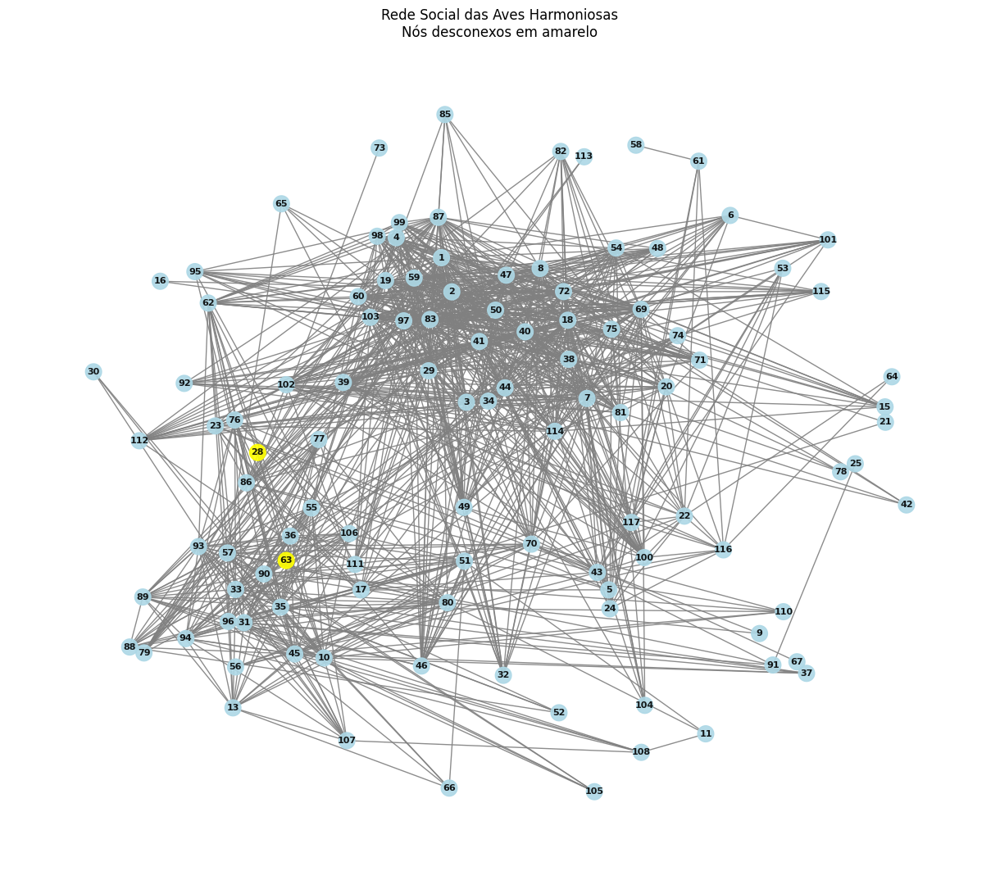

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Carrega o grafo
G = nx.read_weighted_edgelist(EDGE_PATH, nodetype=int)
print(f"Nós: {G.number_of_nodes()} | Arestas: {G.number_of_edges()}")

# Supondo que você já tenha definido pos antes
# pos = ... (mantém o layout original que você usou)

# Nós desconexos que queremos destacar
disconnected_nodes = [28, 63]

# Define cores para todos os nós
node_colors = ['yellow' if n in disconnected_nodes else 'lightblue' for n in G.nodes()]

plt.figure(figsize=(12, 10))
nx.draw(G, pos, with_labels=True,
        node_color=node_colors, node_size=200,
        edge_color='gray', font_size=8, font_weight='bold', alpha=0.9)

plt.title("Rede Social das Aves Harmoniosas\nNós desconexos em amarelo")
plt.axis('off')
plt.show()


Logo, extraem-se os pesos das conexões para análise estatística.

O histograma mostra quais interações são mais frequentes e intensas.

Linha da média e mediana ajudam a identificar assimetria.

Interpretação ecológica: aves com pesos altos interagem mais frequentemente ou com maior afinidade sonora.

O histograma, inclusive ajuda a planejar limiares para análises futuras de modularidade ou propagação de sinal.

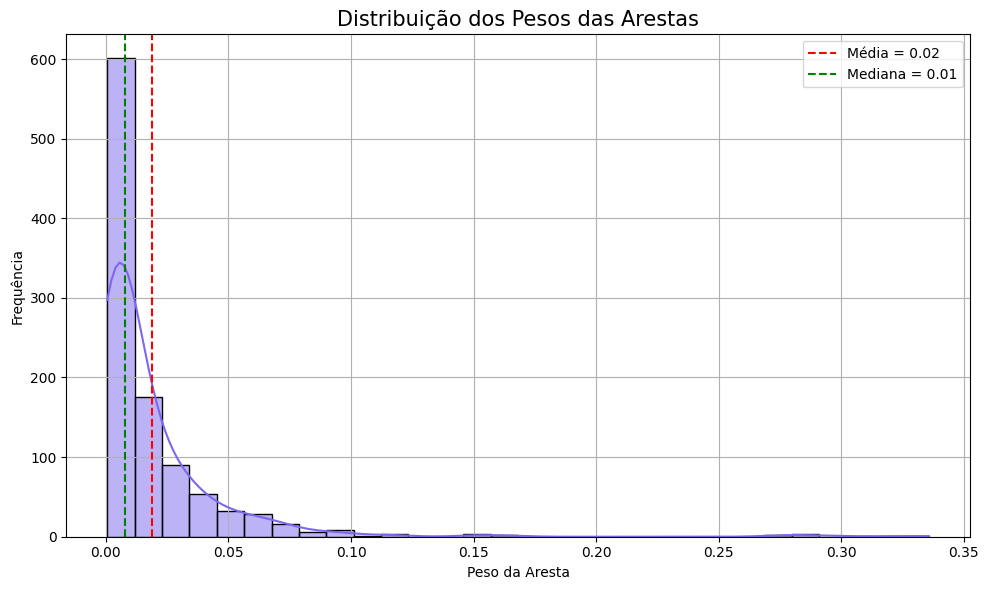

In [ ]:
import pandas as pd
import seaborn as sns

pesos = [d["weight"] for (u, v, d) in G.edges(data=True)]
df_pesos = pd.DataFrame({"Peso da Aresta": pesos})

plt.figure(figsize=(10, 6))
sns.histplot(df_pesos, x="Peso da Aresta", bins=30, kde=True, color="mediumslateblue")
plt.axvline(df_pesos["Peso da Aresta"].mean(), color="red", linestyle="--", label=f"Média = {df_pesos['Peso da Aresta'].mean():.2f}")
plt.axvline(df_pesos["Peso da Aresta"].median(), color="green", linestyle="--", label=f"Mediana = {df_pesos['Peso da Aresta'].median():.2f}")
plt.title("Distribuição dos Pesos das Arestas", fontsize=15)
plt.xlabel("Peso da Aresta")
plt.ylabel("Frequência")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Em seguida, calcula-se três métricas de centralidade, cada uma revelando uma faceta diferente da importância de um nó na rede.

A centralidade de grau mede o número de conexões de cada ave - valores altos indicam potenciais líderes ou aves muito sociais.

A de proximidade (closeness) mede a distância média de um nó para todos os outros - um nó com alta proximidade pode espalhar informação ou sinais rapidamente.

A de intermediação (betweenness) mede quantos caminhos mínimos passam por um nó - valores altos indicam pontes entre subgrupos.

A combinação de diferentes centralidades ajuda a diferenciar aves que são apenas populares (grau alto) de aves que conectam comunidades (betweenness alto).

Cada centralidade é representada visualmente com cores e tamanhos proporcionais ao valor da métrica, nós maiores e mais escuros indicam maior importância segundo a métrica escolhida.

Essa visualização ajuda a identificar padrões de concentração de poder e a omparar rapidamente a influência relativa de cada nó

Por exemplo, betweenness alta mostra nós estratégicos que conectam clusters.

A escala de cores (viridis) facilita distinção visual de valores baixos e altos.

É útil para comunicar diferenças de importância entre nós para leigos.

Pode-se perceber se a rede é centralizada ou distribuída, olhando se poucos nós dominam as métricas ou se está mais homogênea.

In [ ]:
import matplotlib.pyplot as plt

degree_centrality = nx.degree_centrality(G)
closeness = nx.closeness_centrality(G)
betweenness = nx.betweenness_centrality(G)

nx.set_node_attributes(G, degree_centrality, "degree_centrality")
nx.set_node_attributes(G, closeness, "closeness")
nx.set_node_attributes(G, betweenness, "betweenness")

def plot_centrality(G, pos, centrality_dict, title):
    # Tamanho proporcional à centralidade
    node_sizes = [300 + 2000 * centrality_dict[n] for n in G.nodes()]

    # Cores pelo colormap viridis para todos os nós
    cmap = plt.cm.viridis
    min_c = min(centrality_dict.values())
    max_c = max(centrality_dict.values())
    node_colors = [(centrality_dict[n] - min_c) / (max_c - min_c) for n in G.nodes()]

    fig, ax = plt.subplots(figsize=(12, 10))
    nx.draw(G, pos, node_color=node_colors, cmap=cmap, node_size=node_sizes,
            edge_color='gray', with_labels=True, font_size=8, font_weight='bold', alpha=0.9, ax=ax)

    # Barra de cores
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min_c, vmax=max_c))
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label=title)

    ax.set_title(f"Visualização da {title} no Grafo")
    ax.axis('off')
    plt.show()


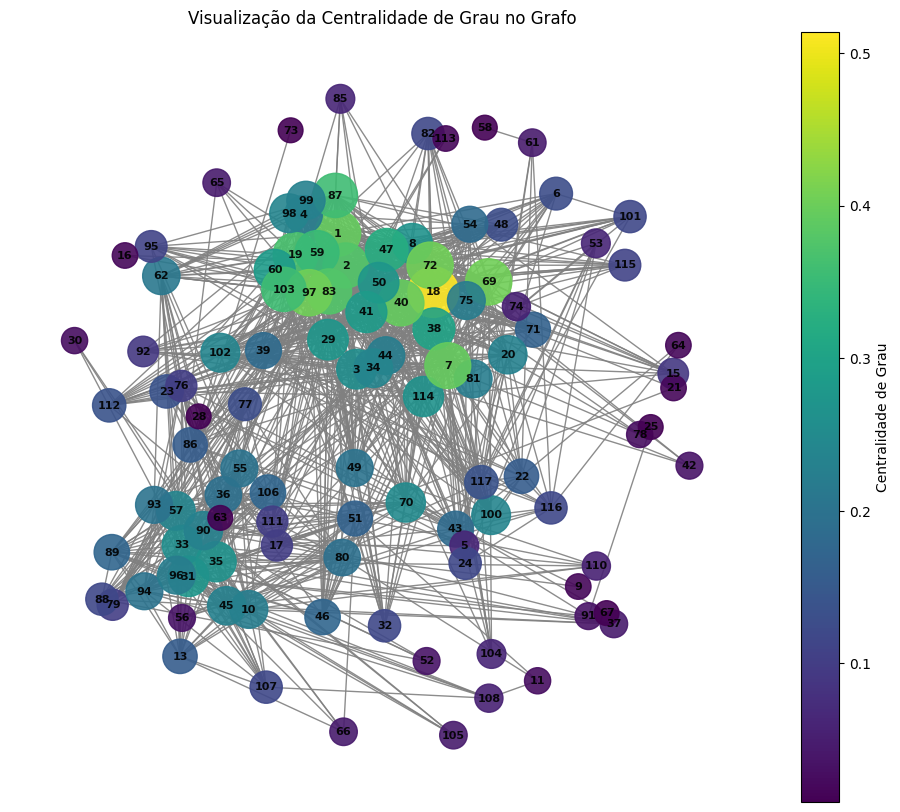

In [ ]:
plot_centrality(G, pos, degree_centrality, "Centralidade de Grau")

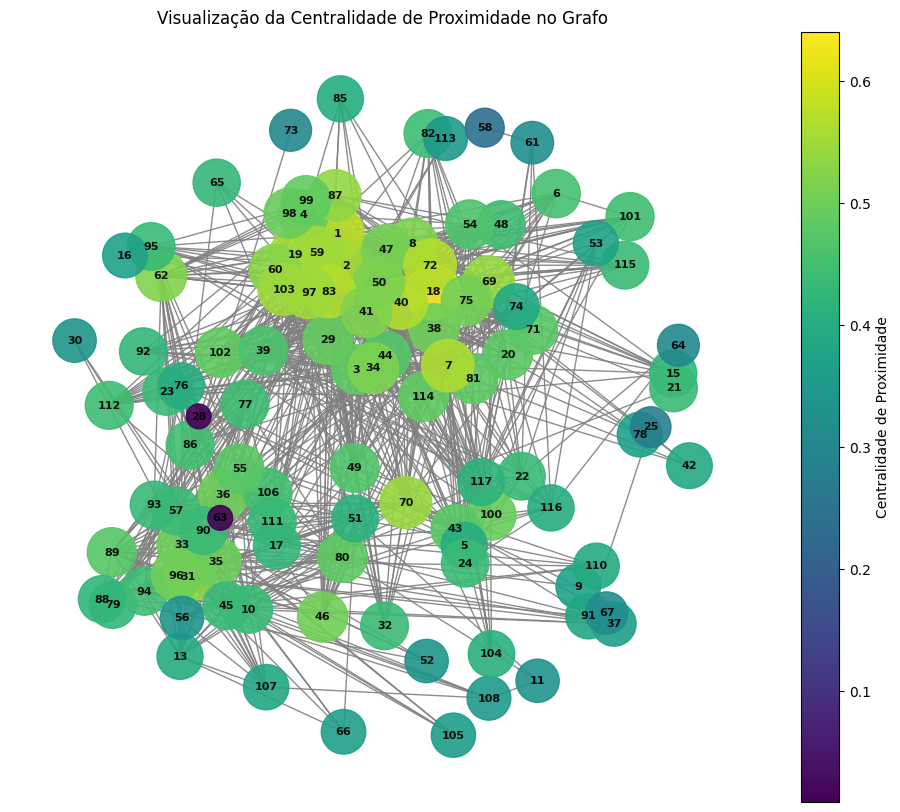

In [ ]:
plot_centrality(G, pos, closeness, "Centralidade de Proximidade")

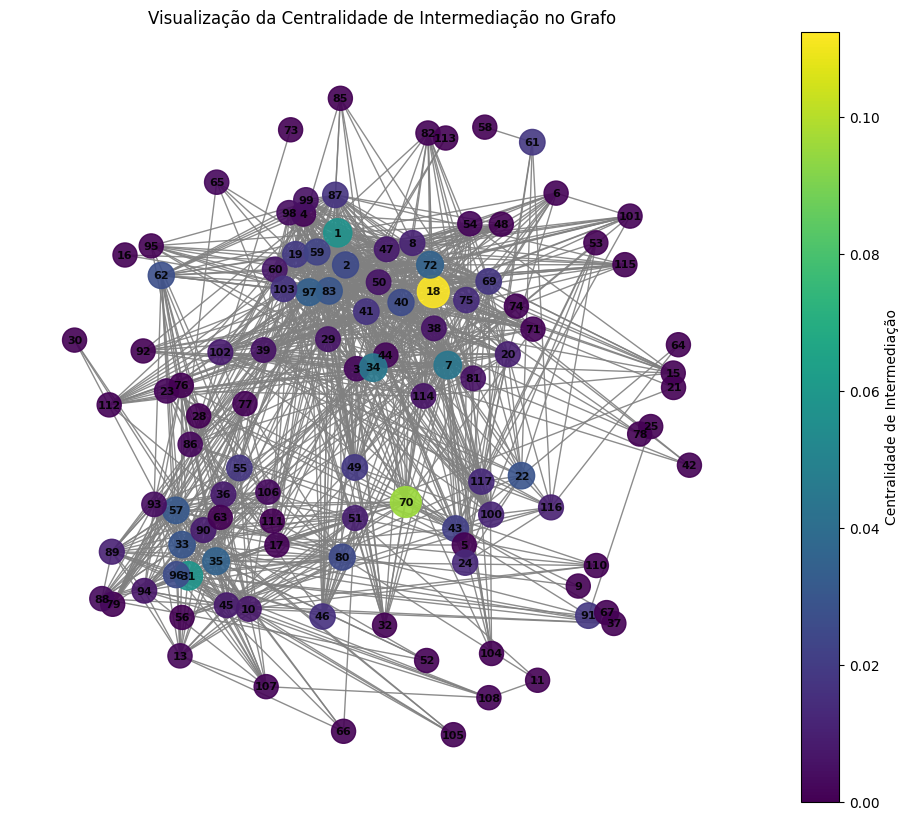

In [ ]:
plot_centrality(G, pos, betweenness, "Centralidade de Intermediação")

Este bloco testa a resiliência da rede ao remover os 10 nós mais centrais.

Comparar o número de componentes antes e depois permite ver como a rede se fragmenta.

Se a rede se fragmenta muito, significa que depende fortemente de hubs.

Essa análise simula situações de falha ou remoção estratégica de indivíduos.

A fragmentação revela nós críticos para a conectividade da comunidade.

Maior número de componentes → menor coesão social, mais grupos isolados.

Permite estudar robustez da rede natural, importante para conservação ou propagação de cantos.

Visualmente, podemos ver como clusters se isolam quando hubs são removidos.

Em redes sociais de aves, hubs removidos podem afetar a propagação de sinais ou aprendizagem cultural.

Quando se remove os 10 nós mais importantes da rede — ou seja, aqueles que têm maior centralidade ou influência — analisa-se o quão dependente ela é destes para se manter conectada. Antes da remoção, a rede estava dividida em dois componentes, indicando que já havia uma certa fragmentação natural. Depois de retirar esses nós centrais, a rede passou a ter três componentes. Essa mudança sugere que os nós removidos eram importantes para manter a coesão da rede, mas ela como um todo não se desfez completamente. Ou seja, mesmo sem esses indivíduos centrais, a maior parte da rede continua conectada e apenas uma pequena parte se separou. Isso indica que a rede das aves não depende excessivamente de poucos indivíduos para se manter funcional. Portanto, podemos concluir que a rede é robusta, mas com alguma vulnerabilidade localizada nos nós centrais, a remoção deles provoca fragmentação, mas não um colapso total da estrutura social das aves.

A partir do grafo, pode-se notar que a rede ja era desconexa (em amarelo), e, após a remoção, observa-se que apenas um nó (em verde) se desconectou da rede principal.

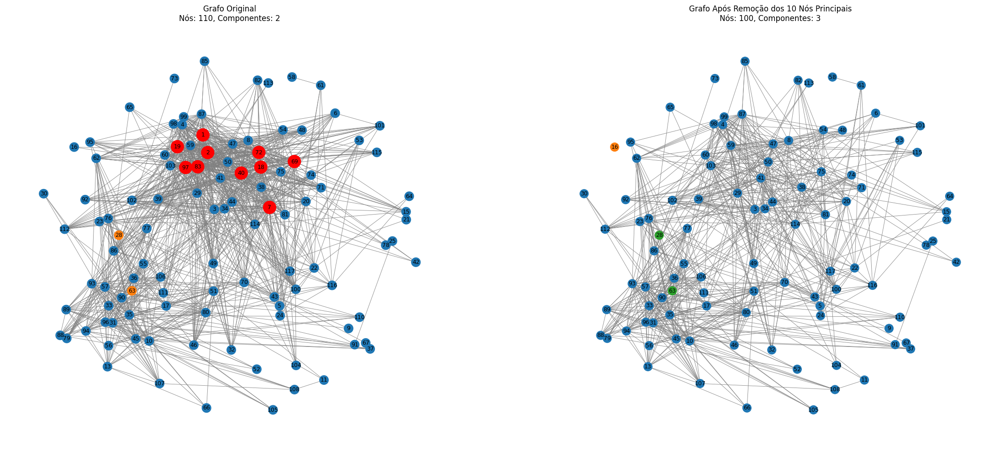

In [ ]:
# Layout fixo (carrega ou gera e salva com mais espaçamento)
if os.path.exists(POS_PATH):
    pos = np.load(POS_PATH, allow_pickle=True).item()
else:
    pos = nx.spring_layout(G, seed=42, k=1.0)  # <--- Aumentei o k para espalhar mais
    np.save(POS_PATH, pos)

plt.figure(figsize=(28, 12))  # <--- Figura maior

# --- Grafo Original ---
plt.subplot(1, 2, 1)
components_original = list(nx.connected_components(G))
colors = plt.cm.tab10.colors
node_colors_original = []

for node in G.nodes():
    if node in top_nodes:
        node_colors_original.append('red')
    else:
        for i, comp in enumerate(components_original):
            if node in comp:
                node_colors_original.append(colors[i % len(colors)])
                break

node_sizes_original = [400 if n in top_nodes else 200 for n in G.nodes()]  # menor diferença
nx.draw(
    G, pos,
    node_color=node_colors_original,
    node_size=node_sizes_original,
    edge_color='gray', width=0.6
)

labels_original = {}
for i, comp in enumerate(components_original):
    if len(comp) < len(G):
        for node in comp:
            labels_original[node] = str(node)
nx.draw_networkx_labels(G, pos, labels=labels_original, font_color='black', font_size=9)

plt.title(f"Grafo Original\nNós: {G.number_of_nodes()}, Componentes: {nx.number_connected_components(G)}")
plt.axis('off')

# --- Grafo Após Remoção ---
plt.subplot(1, 2, 2)
components_removed = list(nx.connected_components(G_removed))
node_colors_removed = []

for node in G_removed.nodes():
    for i, comp in enumerate(components_removed):
        if node in comp:
            node_colors_removed.append(colors[i % len(colors)])
            break

nx.draw(
    G_removed, pos,
    node_color=node_colors_removed,
    node_size=180,
    edge_color='gray', width=0.6
)

labels_removed = {}
for i, comp in enumerate(components_removed):
    if len(comp) < len(G_removed):
        for node in comp:
            labels_removed[node] = str(node)
nx.draw_networkx_labels(G_removed, pos, labels=labels_removed, font_color='black', font_size=9)

plt.title(f"Grafo Após Remoção dos 10 Nós Principais\nNós: {G_removed.number_of_nodes()}, Componentes: {nx.number_connected_components(G_removed)}")
plt.axis('off')

plt.show()


Distribuição de grau mostra como os nós variam em número de conexões.

Pode indicar heterogeneidade (poucos nós com grau alto) ou homogeneidade (graus parecidos).

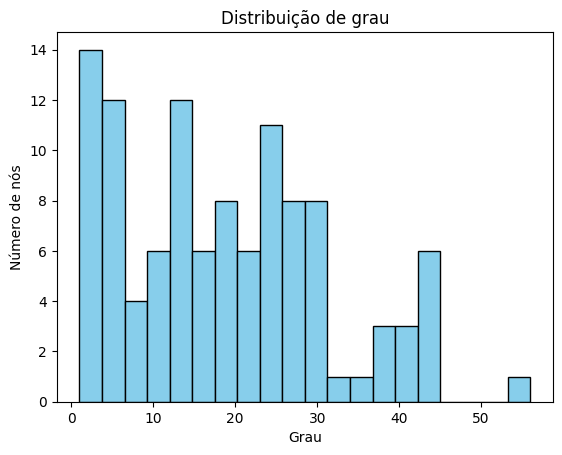

In [ ]:
degrees = [G.degree(n) for n in G.nodes()]
plt.hist(degrees, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribuição de grau")
plt.xlabel("Grau")
plt.ylabel("Número de nós")
plt.show()

global_clustering mede a tendência geral de formação de triângulos (trios de aves interconectadas).

local_clustering calcula essa tendência para cada nó individualmente.

Valores altos indicam subgrupos densamente conectados, possivelmente famílias ou bandos de aves.

Visualizar o histograma ajuda a detectar picos e outliers: hubs ou aves isoladas.

Comparação global x local permite entender estrutura hierárquica da rede.

Clustering alto pode favorecer propagação local de informações, mas limitar difusão global.

Juntas, essas métricas ajudam a caracterizar mundo pequeno ou redes aleatórias.

Permite interpretar como estrutura local e global se relacionam, essencial para prever propagação de cantos ou epidemias.

Clusterização global: 0.5583330251821174


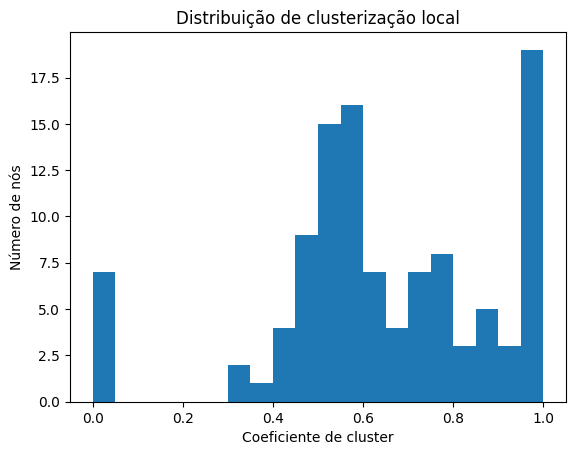

In [ ]:
global_clustering = nx.transitivity(G)
local_clustering = nx.clustering(G)

print("Clusterização global:", global_clustering)

plt.hist(local_clustering.values(), bins=20)
plt.title("Distribuição de clusterização local")
plt.xlabel("Coeficiente de cluster")
plt.ylabel("Número de nós")
plt.show()

Esse bloco detecta comunidades (clusters) na rede, grupos de aves mais conectadas entre si do que com o resto da rede.

O algoritmo greedy_modularity_communities maximiza a modularidade, que mede a diferença entre conexões reais e esperadas aleatoriamente.

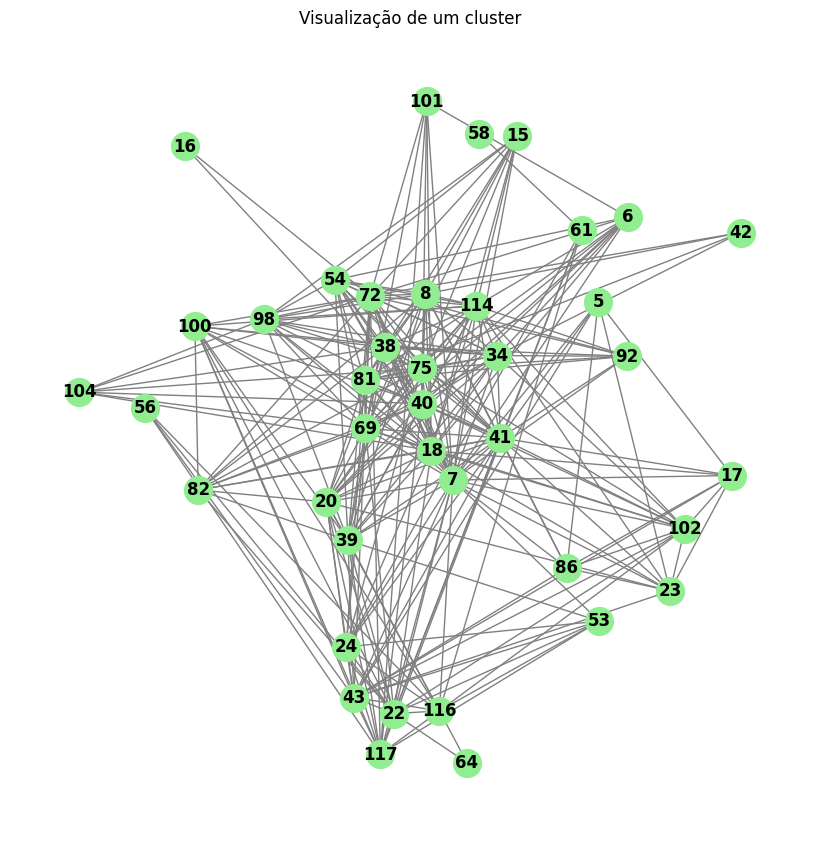

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

# detecta comunidades
comunidades = list(greedy_modularity_communities(G))

# exemplo: pegar a primeira comunidade e criar subgrafo
subG = G.subgraph(list(comunidades[0]))
pos_sub = nx.spring_layout(subG, seed=42, k=0.3)

# plot do subgrafo
plt.figure(figsize=(8, 8))
nx.draw(subG, pos=pos_sub, with_labels=True, node_color='lightgreen', node_size=400,
        font_size=12, font_weight='bold', edge_color='gray', width=1.0)
plt.title("Visualização de um cluster")
plt.axis('off')
plt.show()


Cada comunidade representa um subgrupo funcional: pode ser um grupo social, familiar ou de aprendizagem.

Conhecer comunidades ajuda a entender a estrutura interna da rede, permitindo identificar líderes e pontes estratégicas.

Essas informações podem ser usadas para visualizar sub-redes separadamente, destacando conexões importantes.

Comunidades também são úteis para simular propagação de cantos ou doenças, já que a difusão dentro de uma comunidade é mais rápida.

Pode-se comparar o tamanho e a densidade das comunidades para identificar hubs internos ou subgrupos isolados.

Visualizar com cores diferentes ajuda a perceber sobreposição de comunidades e nós que conectam grupos.

Analisar modularidade global indica quão estruturada é a rede, comparando com redes aleatórias.

Essa análise fornece insights sobre a organização social das aves e permite decisões estratégicas de conservação ou estudo comportamental.

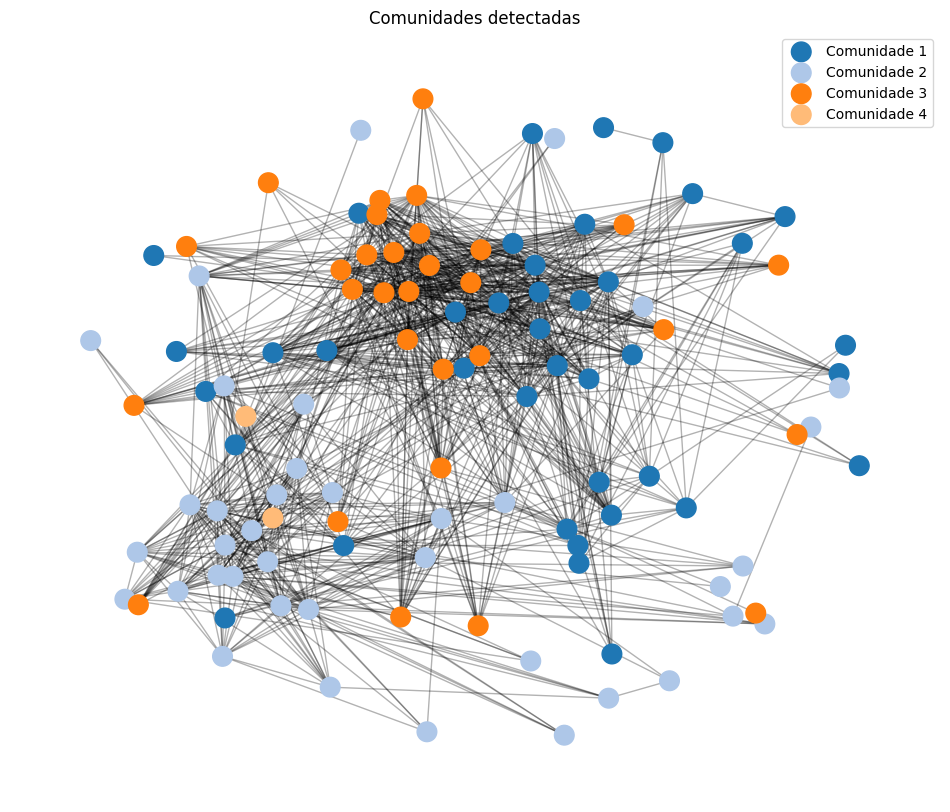

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

comunidades = list(greedy_modularity_communities(G))
cores = plt.cm.tab20.colors  # até 20 cores diferentes

plt.figure(figsize=(12, 10))
ax = plt.gca()

for i, c in enumerate(comunidades):
    nodes = list(c)
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=nodes,
        node_color=[cores[i % len(cores)]] * len(nodes),
        node_size=200,
        ax=ax,
        label=f"Comunidade {i+1}"
    )
nx.draw_networkx_edges(G, pos, alpha=0.3, ax=ax)
plt.title("Comunidades detectadas")
plt.axis('off')
plt.legend()
plt.show()

Cliques representam subgrupos totalmente conectados, onde cada ave está ligada a todas as outras do clique.

Encontrar o clique máximo mostra o maior grupo com conexões completas, ou seja, máxima coesão social.

Isso é útil para identificar grupos de liderança ou subcomunidades muito coesas.

A visualização com cores destacando os cliques facilita a identificação de núcleos de alta interação.

O tamanho do clique mostra o potencial de transmissão de sinais ou cantos rapidamente.

Essa métrica complementa a análise de centralidade, pois nem sempre nós centrais estão nos cliques maiores.

Cliques sobrepostos ajudam a ver interconexões entre diferentes subgrupos.

Analisar todos os cliques permite entender a redundância de conexões, importante para resiliência da rede.

Cliques grandes indicam subgrupos fortes, enquanto cliques pequenos podem ser aves isoladas ou pontes.

Esse tipo de análise é especialmente relevante para estruturas sociais complexas, como aprendizado cultural em aves.

Tamanho máximo de clique: 18


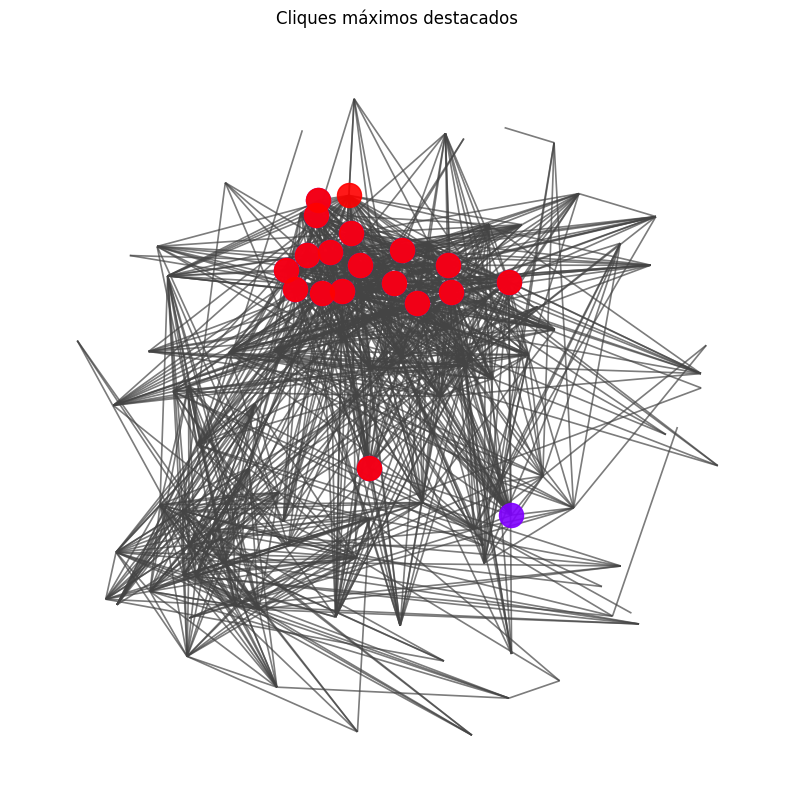

In [ ]:
cliques = list(nx.find_cliques(G))
max_clique_size = max(len(c) for c in cliques)
print("Tamanho máximo de clique:", max_clique_size)

max_cliques = [c for c in cliques if len(c) == max_clique_size]
colors = plt.cm.rainbow(np.linspace(0, 1, len(max_cliques)))

pos_clique = nx.spring_layout(G, seed=42, k=0.25)

plt.figure(figsize=(10, 10))
for clique, color in zip(max_cliques, colors):
    nx.draw_networkx_nodes(G, pos_clique, nodelist=clique, node_color=[color], node_size=300, alpha=0.9)

nx.draw_networkx_edges(G, pos_clique, alpha=0.7, edge_color='#444444', width=1.2)
plt.title("Cliques máximos destacados")
plt.axis('off')
plt.show()

Assortatividade por grau mede se nós com muitos links tendem a se conectar a outros de grau alto (positiva) ou baixo (negativa).

Valores positivos indicam preferência por pares de alta conectividade, típico em redes sociais com líderes que se conectam entre si.

Valores negativos sugerem hubs conectando-se a nós periféricos, indicando hierarquia ou pontes sociais.

Densidade mede a proporção de conexões existentes sobre o total possível, mostrando quão interligada a rede é.

Densidade alta → rede mais coesa; baixa → mais dispersa e fragmentada.

Essas métricas ajudam a caracterizar a robustez e vulnerabilidade da rede.

Juntas, indicam padrões de estrutura global e tendências sociais entre os indivíduos.

Assortatividade negativa combinada com hubs pode indicar dependência de nós-chave.

Densidade baixa com cliques altos sugere subgrupos coesos, mas pouca conectividade global.

Esses indicadores são essenciais para simulações de propagação e planejamento de preservação.

In [ ]:
degree_assortativity = nx.degree_assortativity_coefficient(G)
print(f"Assortatividade por Grau: {degree_assortativity:.4f}")

Assortatividade por Grau: 0.0003


In [ ]:
density = nx.density(G)
print(f"Densidade da rede: {density:.4f}")

Densidade da rede: 0.1713


In [ ]:
if nx.is_connected(G):
    diameter = nx.diameter(G)
    print(f"\nDiâmetro da rede: {diameter}")
else:
    # Se não for conexo, usa a maior componente conexa para cálculo
    largest_cc = max(nx.connected_components(G), key=len)
    G_lcc = G.subgraph(largest_cc)
    diameter = nx.diameter(G_lcc)
    print(f"Grafo não conexo. Diâmetro da maior componente conexa: {diameter}")


Grafo não conexo. Diâmetro da maior componente conexa: 6


In [ ]:
if nx.is_connected(G):
    avg_shortest_path = nx.average_shortest_path_length(G)
    print(f"\nComprimento médio dos caminhos mínimos: {avg_shortest_path:.4f}")
else:
    avg_shortest_path = nx.average_shortest_path_length(G_lcc)
    print(f"Grafo não conexo. Comprimento médio da maior componente conexa: {avg_shortest_path:.4f}")



Grafo não conexo. Comprimento médio da maior componente conexa: 2.2542


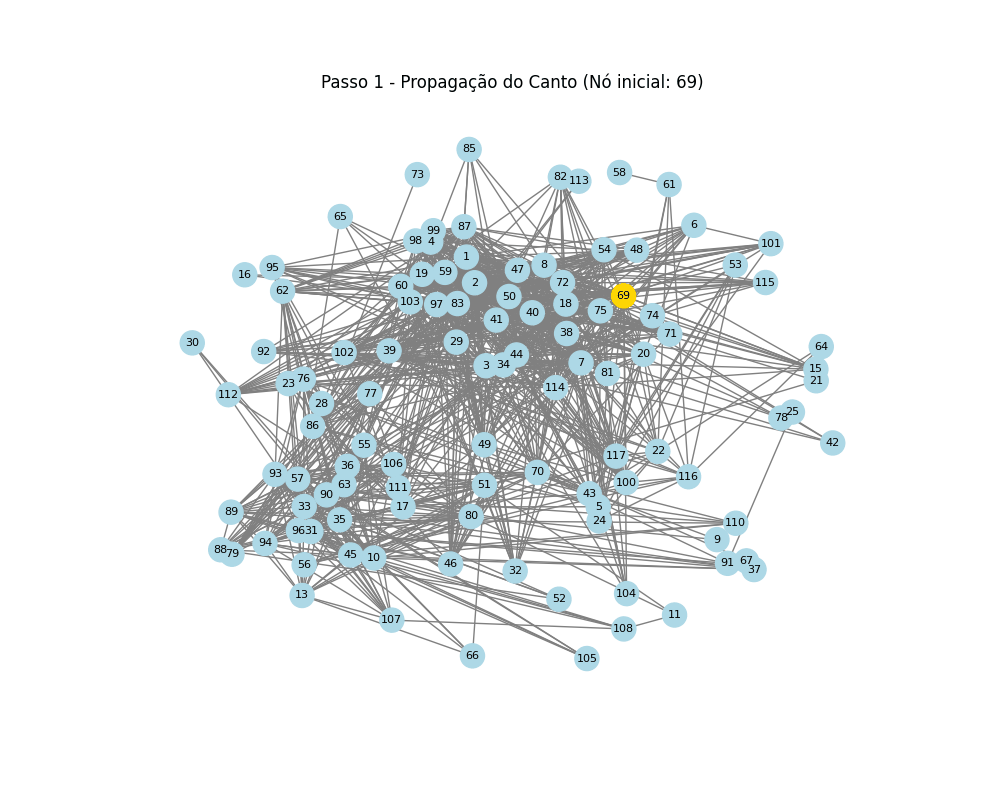

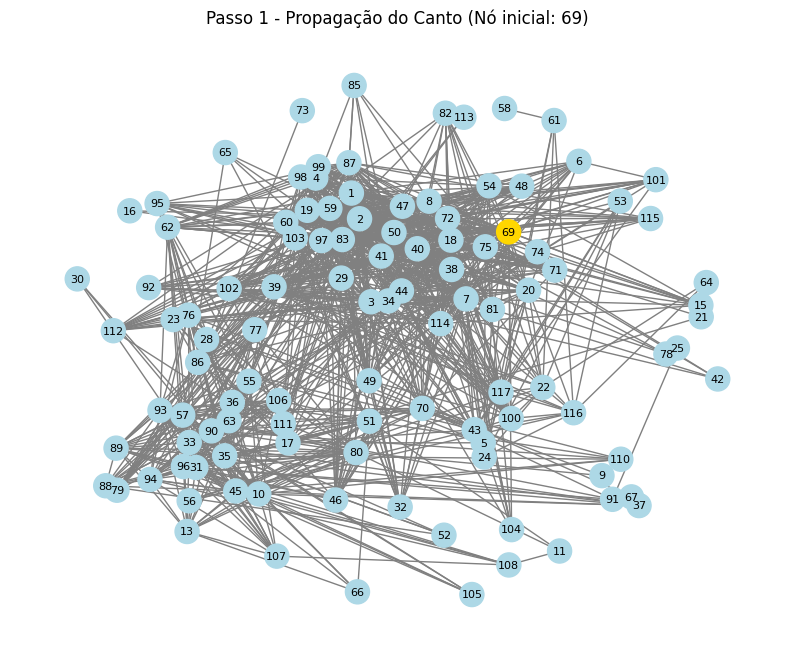

In [ ]:
import random
from matplotlib import animation
import matplotlib.pyplot as plt
import networkx as nx

# nó inicial aleatório
start_node = random.choice(list(G.nodes()))
visited = {start_node}
frames = []

# cálculo da propagação
frontier = [start_node]
while frontier:
    frames.append(list(visited))
    next_frontier = []
    for node in frontier:
        for vizinho in G.neighbors(node):
            if vizinho not in visited:
                visited.add(vizinho)
                next_frontier.append(vizinho)
    frontier = next_frontier

# criar figura
fig, ax = plt.subplots(figsize=(10, 8))
def update(frame):
    ax.clear()
    colors = ["gold" if n in frames[frame] else "lightblue" for n in G.nodes()]
    nx.draw(G, pos, node_color=colors, with_labels=True, edge_color="gray",
            node_size=300, font_size=8)
    ax.set_title(f"Passo {frame+1} - Propagação do Canto (Nó inicial: {start_node})")
    ax.axis("off")

# criar animação
ani = animation.FuncAnimation(fig, update, frames=len(frames),
                              interval=500, repeat=False)

# salvar como GIF
ani.save('/content/propagacao_canto.gif', writer='pillow')

# exibir GIF
from IPython.display import Image
Image('/content/propagacao_canto.gif')



📊 Métricas para Rede de Canto (forte):
Nós: 99 | Arestas: 514
Densidade: 0.1060
Número de comunidades: 5
Modularidade: 0.5981
Assortatividade por grau: 0.2504

📊 Métricas para Rede de Proximidade (fraca):
Nós: 103 | Arestas: 513
Densidade: 0.0977
Diâmetro: 5
Número de comunidades: 3
Modularidade: 0.3476
Assortatividade por grau: -0.0462


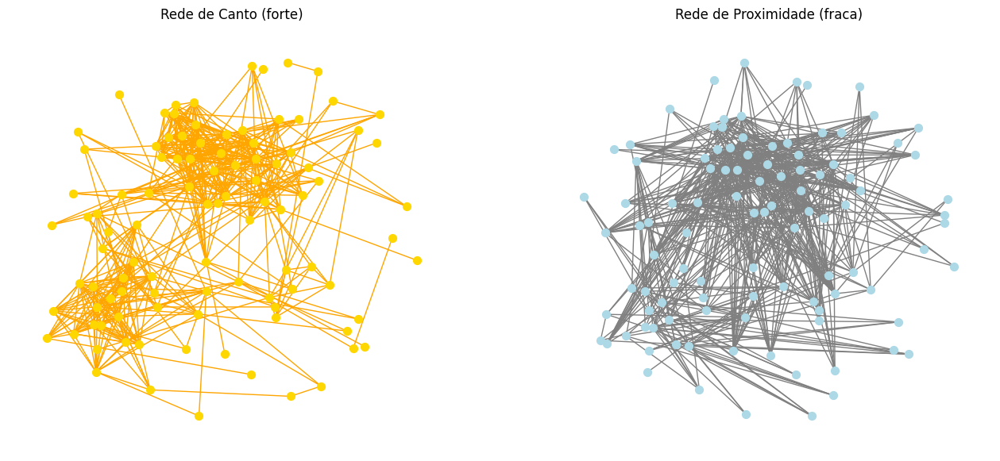

In [ ]:
from networkx.algorithms.community import modularity

# Definindo limiar de peso para separar redes
limiar = np.median(pesos)

# Rede de canto (interações fortes)
G_canto = nx.Graph(((u, v, d) for u, v, d in G.edges(data=True) if d['weight'] >= limiar))

# Rede de proximidade (interações fracas)
G_proximidade = nx.Graph(((u, v, d) for u, v, d in G.edges(data=True) if d['weight'] < limiar))

def analisar_rede(G, nome):
    print(f"\n📊 Métricas para {nome}:")
    print(f"Nós: {G.number_of_nodes()} | Arestas: {G.number_of_edges()}")
    print(f"Densidade: {nx.density(G):.4f}")
    if nx.is_connected(G):
        print(f"Diâmetro: {nx.diameter(G)}")
    comunidades = list(greedy_modularity_communities(G))
    print(f"Número de comunidades: {len(comunidades)}")
    print(f"Modularidade: {modularity(G, comunidades):.4f}")
    print(f"Assortatividade por grau: {nx.degree_assortativity_coefficient(G):.4f}")

# Análise das duas redes
analisar_rede(G_canto, "Rede de Canto (forte)")
analisar_rede(G_proximidade, "Rede de Proximidade (fraca)")

# Visualização lado a lado
plt.figure(figsize=(16, 7))

plt.subplot(1, 2, 1)
nx.draw(G_canto, pos, with_labels=False, node_color="gold", edge_color="orange", node_size=50)
plt.title("Rede de Canto (forte)")

plt.subplot(1, 2, 2)
nx.draw(G_proximidade, pos, with_labels=False, node_color="lightblue", edge_color="gray", node_size=50)
plt.title("Rede de Proximidade (fraca)")

plt.show()


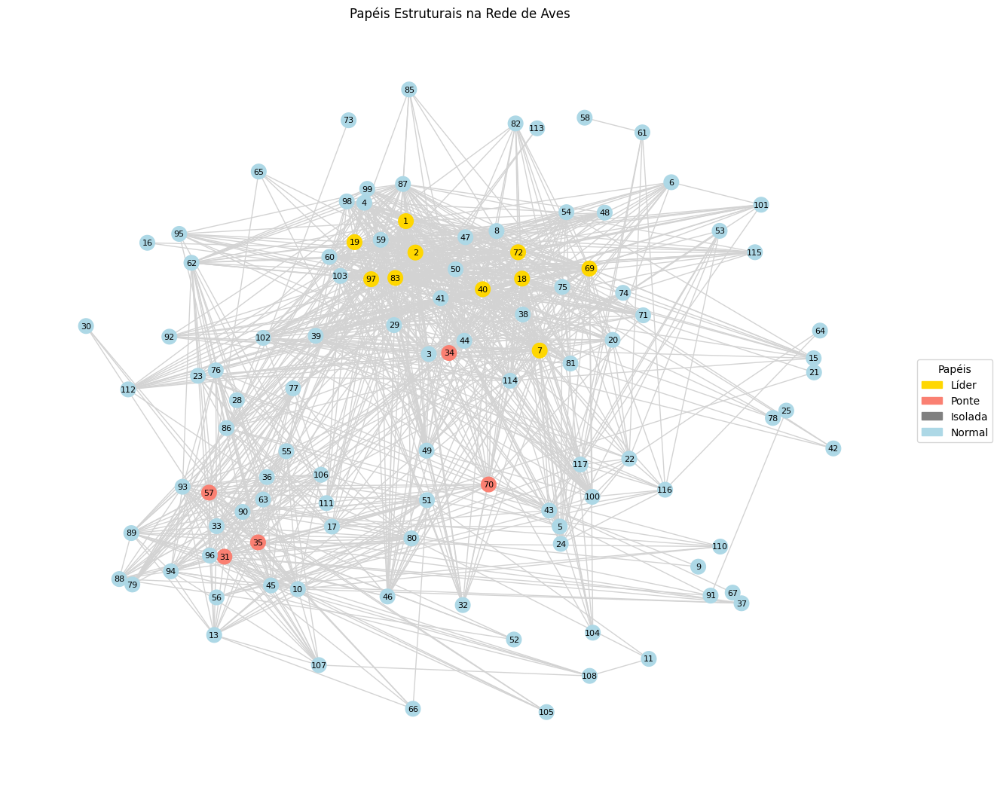

In [ ]:
papel = {}
for n in G.nodes():
    if degree_centrality[n] > np.percentile(list(degree_centrality.values()), 90):
        papel[n] = "Líder"
    elif betweenness[n] > np.percentile(list(betweenness.values()), 90):
        papel[n] = "Ponte"
    elif G.degree(n) == 0:
        papel[n] = "Isolada"
    else:
        papel[n] = "Normal"

cores_papel = {
    "Líder": "gold",
    "Ponte": "salmon",
    "Isolada": "gray",
    "Normal": "lightblue"
}

plt.figure(figsize=(12, 10))
nx.draw(G, pos,
        node_color=[cores_papel[papel[n]] for n in G.nodes()],
        with_labels=True,
        edge_color='lightgray',
        node_size=200,
        font_size=8)

# Legenda ao lado
import matplotlib.patches as mpatches
patches = [mpatches.Patch(color=color, label=role)
           for role, color in cores_papel.items()]
plt.legend(handles=patches, title="Papéis", loc="center left", bbox_to_anchor=(1, 0.5))

plt.title("Papéis Estruturais na Rede de Aves")
plt.show()



✅ Conclusões da Análise Estrutural

🔹 📊 Lei de Potência:

Exponente α = 4.10 → Muito acima da faixa típica de redes sem escala (2 ≤ α ≤ 3).

R = –2.35 (negativo) e p = 0.016 → A distribuição de graus se ajusta melhor a uma distribuição exponencial (como nas redes aleatórias).

❌ Conclusão: Sua rede não segue uma lei de potência. Provavelmente ela não é uma rede sem escala.

🔹 🌍 Mundo Pequeno:

Clustering real = 0.65 → Muito maior que o clustering da rede aleatória (~0.17).

Caminho médio real = 2.25 (versus 1.85 na rede aleatória) → Um pouco maior.

Porém, a diferença no caminho médio ultrapassa os 20%, e o teste formal não confirmou a propriedade.

⚠️ Conclusão: Sua rede tem alto agrupamento, mas não atende bem ao critério clássico de mundo pequeno (caminhos curtos + alto clustering).

🧠 Interpretação final (em linguagem acessível):

Sua rede não mostra sinais de ser “sem escala”, pois não possui hubs com grau muito elevado (distribuição de grau não segue lei de potência).

Apesar de ter forte agrupamento (aves conectadas entre si formam subgrupos bem definidos), os caminhos não são suficientemente curtos para classificá-la como rede de “mundo pequeno”.

A estrutura geral se assemelha mais a uma rede aleatória com comunidades fortemente conectadas internamente.

📊 Análise da Lei de Potência
Alpha: 4.1042 (esperado entre 2 e 3 p/ sem escala)
xmin: 23.0
Comparação power law vs exponencial -> R=-2.3540, p=0.0164
Conclusão: Mais parecida com rede aleatória.


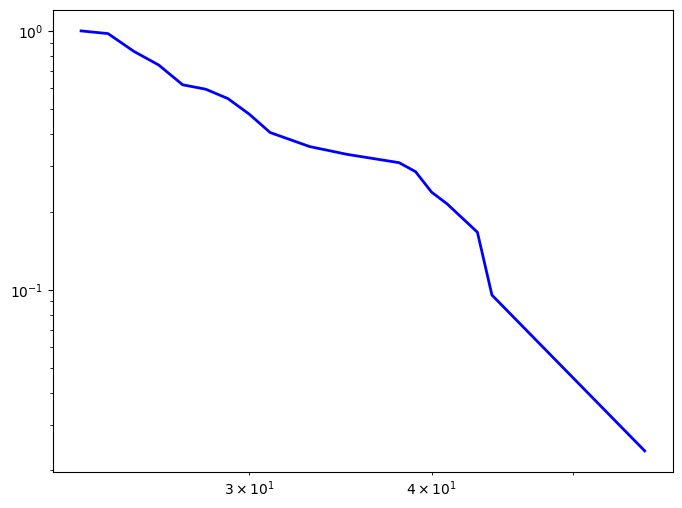

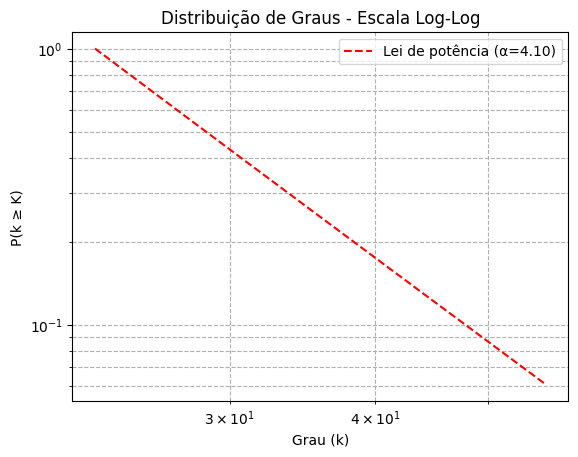


🌍 Análise Mundo Pequeno
Clustering real: 0.6548 | Clustering aleatório: 0.1747
Caminho médio real: 2.2542 | Caminho médio aleatório: 1.8498
Conclusão: A rede não se comporta como mundo pequeno.


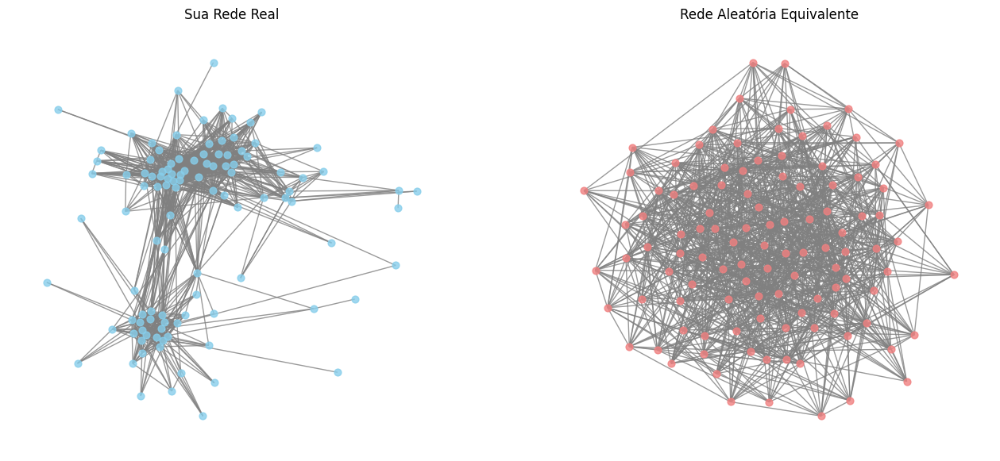

In [ ]:
!pip install powerlaw

import powerlaw
import numpy as np

# -----------------------
# 1. Análise Lei de Potência
# -----------------------
graus = [G.degree(n) for n in G.nodes()]
fit = powerlaw.Fit(graus, discrete=True, verbose=False)

alpha = fit.alpha
xmin = fit.xmin
R, p_val = fit.distribution_compare('power_law', 'exponential')

print("📊 Análise da Lei de Potência")
print(f"Alpha: {alpha:.4f} (esperado entre 2 e 3 p/ sem escala)")
print(f"xmin: {xmin}")
print(f"Comparação power law vs exponencial -> R={R:.4f}, p={p_val:.4f}")

if 2 <= alpha <= 3 and R > 0 and p_val > 0.05:
    conclusao_power = "Provável rede sem escala (scale-free)."
elif R < 0:
    conclusao_power = "Mais parecida com rede aleatória."
else:
    conclusao_power = "Não segue claramente lei de potência nem exponencial."
print("Conclusão:", conclusao_power)

# Plot CCDF log-log
plt.figure(figsize=(8, 6))
fit.plot_ccdf(color='blue', linewidth=2, label='Dados')
fit.power_law.plot_ccdf(color='red', linestyle='--', label=f'Lei de potência (α={alpha:.2f})')
plt.xlabel('Grau (k)')
plt.ylabel('P(k ≥ K)')
plt.title('Distribuição de Graus - Escala Log-Log')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

# -----------------------
# 2. Teste Mundo Pequeno
# -----------------------
if not nx.is_connected(G):
    G_lcc = G.subgraph(max(nx.connected_components(G), key=len)).copy()
else:
    G_lcc = G

n = G_lcc.number_of_nodes()
m = G_lcc.number_of_edges()

C_real = nx.average_clustering(G_lcc)
L_real = nx.average_shortest_path_length(G_lcc)

# Rede aleatória equivalente
G_rand = nx.gnm_random_graph(n, m, seed=42)
C_rand = nx.average_clustering(G_rand)
L_rand = nx.average_shortest_path_length(G_rand)

print("\n🌍 Análise Mundo Pequeno")
print(f"Clustering real: {C_real:.4f} | Clustering aleatório: {C_rand:.4f}")
print(f"Caminho médio real: {L_real:.4f} | Caminho médio aleatório: {L_rand:.4f}")

if C_real > C_rand and abs(L_real - L_rand) / L_rand < 0.2:
    conclusao_ws = "A rede apresenta características de mundo pequeno."
else:
    conclusao_ws = "A rede não se comporta como mundo pequeno."
print("Conclusão:", conclusao_ws)

# -----------------------
# 3. Comparação visual
# -----------------------
pos_real = nx.spring_layout(G_lcc, seed=42)
pos_rand = nx.spring_layout(G_rand, seed=42)

plt.figure(figsize=(16, 7))

plt.subplot(1, 2, 1)
nx.draw(G_lcc, pos_real, node_size=40, node_color="skyblue", edge_color="gray", alpha=0.8)
plt.title("Sua Rede Real")

plt.subplot(1, 2, 2)
nx.draw(G_rand, pos_rand, node_size=40, node_color="lightcoral", edge_color="gray", alpha=0.8)
plt.title("Rede Aleatória Equivalente")

plt.show()


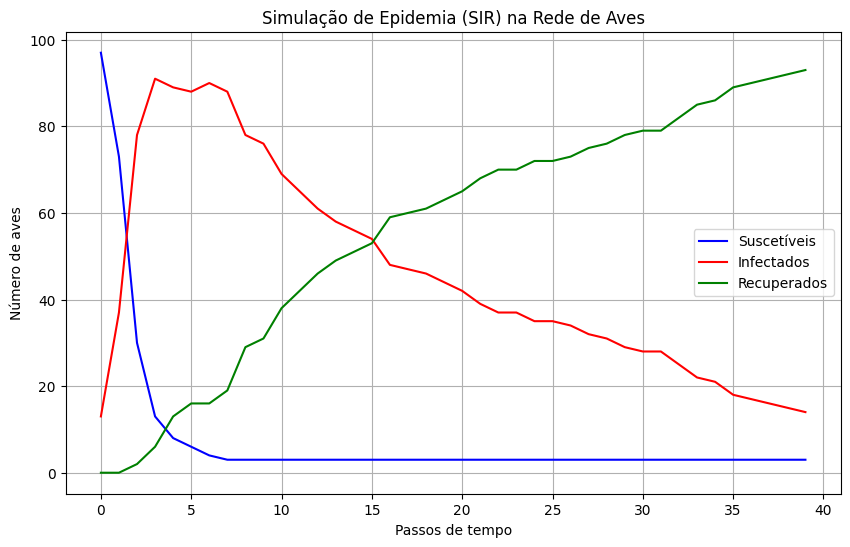

In [ ]:
import matplotlib.pyplot as plt
import random

def simular_SIR(G, beta=0.2, gamma=0.05, steps=50):
    """
    Modelo SIR em uma rede:
    - beta: probabilidade de contágio
    - gamma: probabilidade de recuperação
    - steps: número de iterações
    """
    estados = {n: "S" for n in G.nodes()}  # todos suscetíveis
    infectado_inicial = random.choice(list(G.nodes()))
    estados[infectado_inicial] = "I"

    historico_S, historico_I, historico_R = [], [], []

    for _ in range(steps):
        novos_estados = estados.copy()
        for n in G.nodes():
            if estados[n] == "I":
                # Infecta vizinhos suscetíveis
                for vizinho in G.neighbors(n):
                    if estados[vizinho] == "S" and random.random() < beta:
                        novos_estados[vizinho] = "I"
                # Recupera com probabilidade gamma
                if random.random() < gamma:
                    novos_estados[n] = "R"
        estados = novos_estados

        # Contagem
        S = sum(1 for x in estados.values() if x == "S")
        I = sum(1 for x in estados.values() if x == "I")
        R = sum(1 for x in estados.values() if x == "R")
        historico_S.append(S)
        historico_I.append(I)
        historico_R.append(R)

    return historico_S, historico_I, historico_R

S, I, R = simular_SIR(G, beta=0.25, gamma=0.05, steps=40)

plt.figure(figsize=(10,6))
plt.plot(S, label="Suscetíveis", color="blue")
plt.plot(I, label="Infectados", color="red")
plt.plot(R, label="Recuperados", color="green")
plt.xlabel("Passos de tempo")
plt.ylabel("Número de aves")
plt.title("Simulação de Epidemia (SIR) na Rede de Aves")
plt.legend()
plt.grid(True)
plt.show()



🔹 Rede das Aves
Nós: 110, Arestas: 1027
Clustering médio: 0.6429
Caminho médio: 2.2542

🔹 Erdős–Rényi
Nós: 110, Arestas: 1027
Clustering médio: 0.1710
Caminho médio: 1.8585

🔹 Barabási–Albert
Nós: 110, Arestas: 909
Clustering médio: 0.2387
Caminho médio: 1.9374

🔹 Watts–Strogatz
Nós: 110, Arestas: 220
Clustering médio: 0.3558
Caminho médio: 5.2063


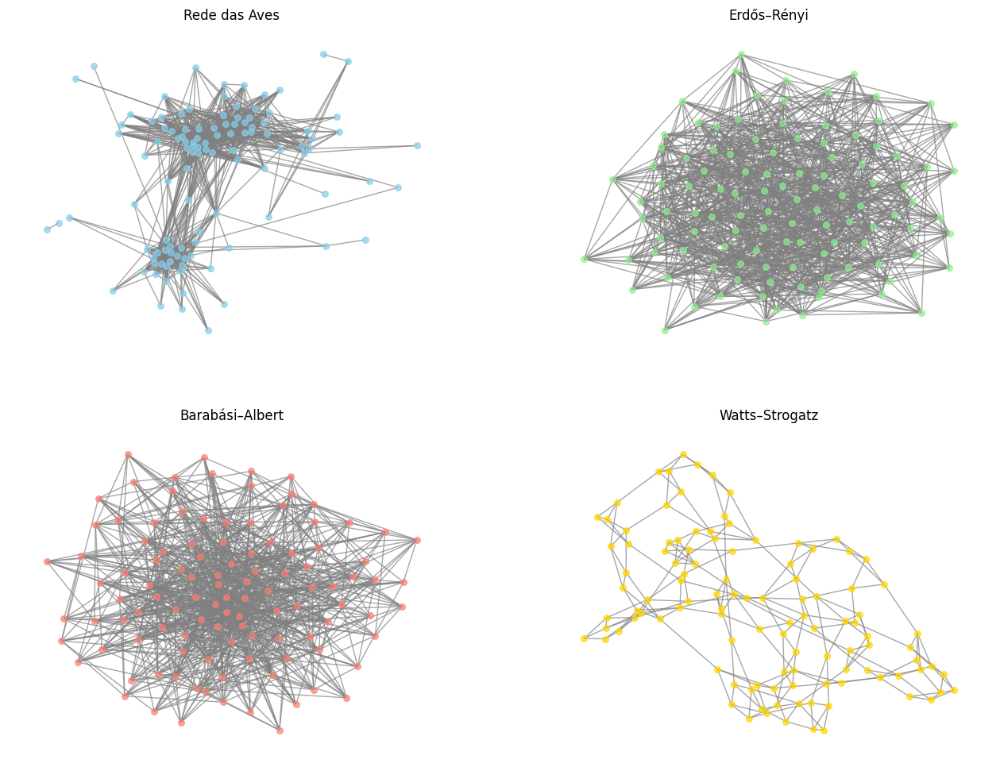

In [ ]:
n = G.number_of_nodes()
m = G.number_of_edges()

# Erdős–Rényi
ER = nx.gnm_random_graph(n, m, seed=42)

# Barabási–Albert (rede livre de escala)
BA = nx.barabasi_albert_graph(n, max(1, int(m/n)), seed=42)

# Watts–Strogatz (mundo pequeno)
WS = nx.watts_strogatz_graph(n, k=4, p=0.1, seed=42)

def resumo_rede(H, nome):
    if nx.is_connected(H):
        L = nx.average_shortest_path_length(H)
    else:
        # pega maior componente conexa como subgrafo
        largest_cc = max(nx.connected_components(H), key=len)
        H_lcc = H.subgraph(largest_cc).copy()
        L = nx.average_shortest_path_length(H_lcc)
    print(f"\n🔹 {nome}")
    print(f"Nós: {H.number_of_nodes()}, Arestas: {H.number_of_edges()}")
    print(f"Clustering médio: {nx.average_clustering(H):.4f}")
    print(f"Caminho médio: {L:.4f}")


resumo_rede(G, "Rede das Aves")
resumo_rede(ER, "Erdős–Rényi")
resumo_rede(BA, "Barabási–Albert")
resumo_rede(WS, "Watts–Strogatz")

plt.figure(figsize=(16,12))
for i, (H, nome, cor) in enumerate([(G, "Rede das Aves", "skyblue"),
                                    (ER, "Erdős–Rényi", "lightgreen"),
                                    (BA, "Barabási–Albert", "salmon"),
                                    (WS, "Watts–Strogatz", "gold")]):
    plt.subplot(2,2,i+1)
    nx.draw(H, nx.spring_layout(H, seed=42), node_size=30, node_color=cor, edge_color="gray", alpha=0.7)
    plt.title(nome)
plt.show()


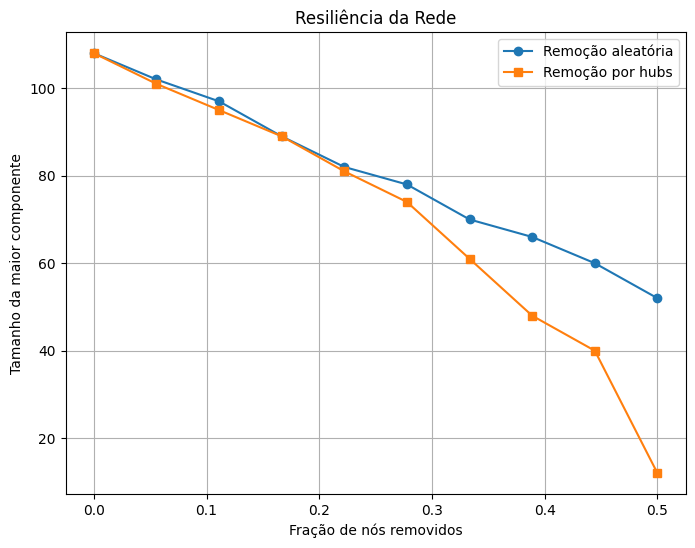

In [ ]:
def remover_nos(G, metodo="aleatorio", frac=0.1):
    H = G.copy()
    n_remove = int(frac * H.number_of_nodes())
    if metodo == "aleatorio":
        nos = random.sample(list(H.nodes()), n_remove)
    elif metodo == "grau":
        nos = sorted(H.degree, key=lambda x: x[1], reverse=True)[:n_remove]
        nos = [n for n,_ in nos]
    H.remove_nodes_from(nos)
    if len(H) == 0:
        return 0
    return len(max(nx.connected_components(H), key=len))

fracs = np.linspace(0, 0.5, 10)
tamanhos_aleatorio = [remover_nos(G, "aleatorio", f) for f in fracs]
tamanhos_grau = [remover_nos(G, "grau", f) for f in fracs]

plt.figure(figsize=(8,6))
plt.plot(fracs, tamanhos_aleatorio, label="Remoção aleatória", marker="o")
plt.plot(fracs, tamanhos_grau, label="Remoção por hubs", marker="s")
plt.xlabel("Fração de nós removidos")
plt.ylabel("Tamanho da maior componente")
plt.title("Resiliência da Rede")
plt.legend()
plt.grid(True)
plt.show()


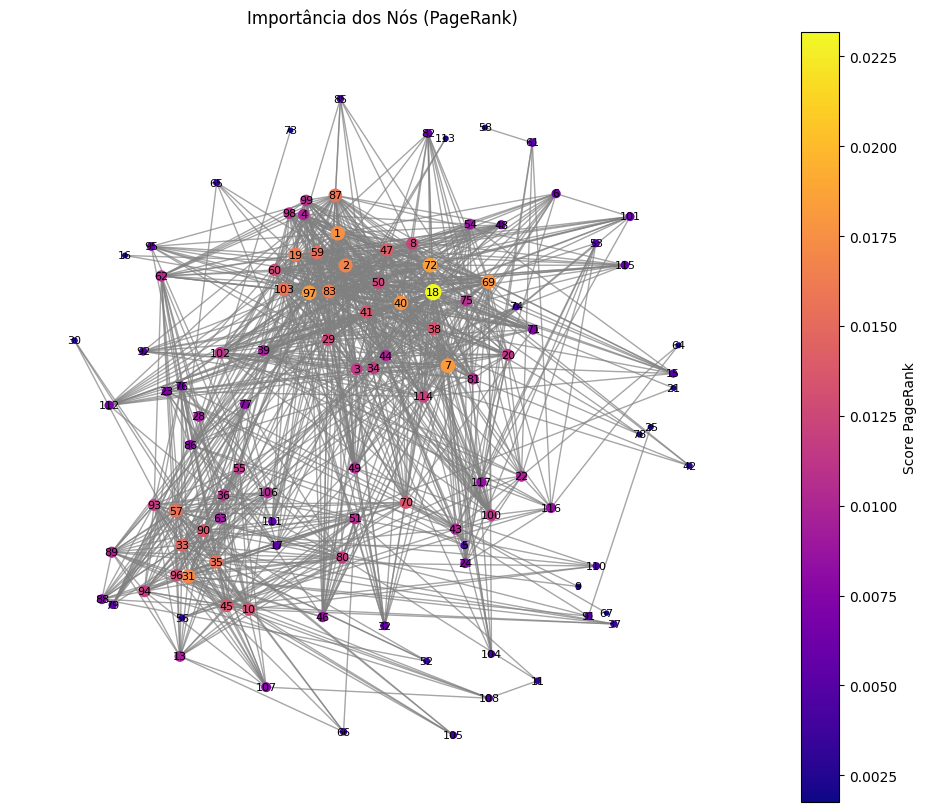

In [ ]:
fig, ax = plt.subplots(figsize=(12, 10))

# valores do pagerank
node_values = [pagerank[n] for n in G.nodes()]
node_sizes = [5000 * pagerank[n] for n in G.nodes()]

# desenhar grafo nos eixos "ax"
nodes = nx.draw_networkx_nodes(
    G, pos,
    node_color=node_values,
    cmap=plt.cm.plasma,
    node_size=node_sizes,
    ax=ax
)
nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.7, ax=ax)
nx.draw_networkx_labels(G, pos, font_size=8, ax=ax)

# criar mapeamento de cores ligado ao mesmo ax
sm = plt.cm.ScalarMappable(
    cmap=plt.cm.plasma,
    norm=plt.Normalize(vmin=min(node_values), vmax=max(node_values))
)
sm.set_array([])

# agora a barra de cores funciona
cbar = fig.colorbar(sm, ax=ax, label="Score PageRank")

ax.set_title("Importância dos Nós (PageRank)")
ax.set_axis_off()
plt.show()
